In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score
from sklearn.tree import plot_tree
import scipy.cluster.hierarchy as sch
from sklearn.metrics import calinski_harabasz_score
import plotly.express as px
from sklearn.manifold import TSNE
from sklearn.metrics import rand_score
from sklearn.cluster import AgglomerativeClustering, SpectralClustering

import warnings
warnings.filterwarnings('ignore')

In [4]:
data = pd.read_csv('ds_salaries.csv')
data

,work_year,experience_level,employment_type,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size
0,2023,SE,FT,Principal Data Scientist,80000,EUR,85847,ES,100,ES,L
1,2023,MI,CT,ML Engineer,30000,USD,30000,US,100,US,S
2,2023,MI,CT,ML Engineer,25500,USD,25500,US,100,US,S
3,2023,SE,FT,Data Scientist,175000,USD,175000,CA,100,CA,M
4,2023,SE,FT,Data Scientist,120000,USD,120000,CA,100,CA,M
...,...,...,...,...,...,...,...,...,...,...,...
3750,2020,SE,FT,Data Scientist,412000,USD,412000,US,100,US,L
3751,2021,MI,FT,Principal Data Scientist,151000,USD,151000,US,100,US,L
3752,2020,EN,FT,Data Scientist,105000,USD,105000,US,100,US,S
3753,2020,EN,CT,Business Data Analyst,100000,USD,100000,US,100,US,L


In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3755 entries, 0 to 3754
Data columns (total 11 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   work_year           3755 non-null   int64 
 1   experience_level    3755 non-null   object
 2   employment_type     3755 non-null   object
 3   job_title           3755 non-null   object
 4   salary              3755 non-null   int64 
 5   salary_currency     3755 non-null   object
 6   salary_in_usd       3755 non-null   int64 
 7   employee_residence  3755 non-null   object
 8   remote_ratio        3755 non-null   int64 
 9   company_location    3755 non-null   object
 10  company_size        3755 non-null   object
dtypes: int64(4), object(7)
memory usage: 322.8+ KB


Всего 3755 объектов и 11 признаков:

work_year: Год выплаты зарплаты, важен из-за экономических условий.

experience_level: Уровень опыта сотрудника, влияющий на зарплату.

employment_type: Тип занятости (полный день, контракт), определяющий зарплату.

job_title: Должность, которая влияет на уровень оплаты.

salary: Общая выплаченная зарплата.

salary_currency: Валюта выплаты зарплаты (ISO код).

salaryinusd: Зарплата в долларах США для сравнения.

employee_residence: Страна проживания сотрудника (ISO код), влияющая на зарплату.

remote_ratio: Доля удаленной работы, которая может влиять на оплату.

company_location: Местоположение компании, влияющее на уровень зарплат.

company_size: Размер компании, влияющий на структуру зарплат.


In [6]:
data.isna().sum()


work_year             0
experience_level      0
employment_type       0
job_title             0
salary                0
salary_currency       0
salary_in_usd         0
employee_residence    0
remote_ratio          0
company_location      0
company_size          0
dtype: int64

In [7]:
duplicate_rows_data = data[data.duplicated()]
print("number of duplicate rows: ", duplicate_rows_data.shape)

number of duplicate rows:  (1171, 11)


In [8]:
for column in data.columns:
    num_distinct_values = len(data[column].unique())
    print(f"{column}: {num_distinct_values} distinct values")

work_year: 4 distinct values
experience_level: 4 distinct values
employment_type: 4 distinct values
job_title: 93 distinct values
salary: 815 distinct values
salary_currency: 20 distinct values
salary_in_usd: 1035 distinct values
employee_residence: 78 distinct values
remote_ratio: 3 distinct values
company_location: 72 distinct values
company_size: 3 distinct values


In [9]:
df_numeric = data.select_dtypes(include='number')
df_numeric

,work_year,salary,salary_in_usd,remote_ratio
0,2023,80000,85847,100
1,2023,30000,30000,100
2,2023,25500,25500,100
3,2023,175000,175000,100
4,2023,120000,120000,100
...,...,...,...,...
3750,2020,412000,412000,100
3751,2021,151000,151000,100
3752,2020,105000,105000,100
3753,2020,100000,100000,100


In [10]:
df_categorical = data.select_dtypes(include='object')
df_categorical

,experience_level,employment_type,job_title,salary_currency,employee_residence,company_location,company_size
0,SE,FT,Principal Data Scientist,EUR,ES,ES,L
1,MI,CT,ML Engineer,USD,US,US,S
2,MI,CT,ML Engineer,USD,US,US,S
3,SE,FT,Data Scientist,USD,CA,CA,M
4,SE,FT,Data Scientist,USD,CA,CA,M
...,...,...,...,...,...,...,...
3750,SE,FT,Data Scientist,USD,US,US,L
3751,MI,FT,Principal Data Scientist,USD,US,US,L
3752,EN,FT,Data Scientist,USD,US,US,S
3753,EN,CT,Business Data Analyst,USD,US,US,L


In [11]:
salary_features = ['salary', 'salary_currency', 'salary_in_usd']
data[salary_features]

,salary,salary_currency,salary_in_usd
0,80000,EUR,85847
1,30000,USD,30000
2,25500,USD,25500
3,175000,USD,175000
4,120000,USD,120000
...,...,...,...
3750,412000,USD,412000
3751,151000,USD,151000
3752,105000,USD,105000
3753,100000,USD,100000


In [12]:
df_numeric.describe()

,work_year,salary,salary_in_usd,remote_ratio
count,3755.000000,3.755000e+03,3755.000000,3755.000000
mean,2022.373635,1.906956e+05,137570.389880,46.271638
std,0.691448,6.716765e+05,63055.625278,48.589050
min,2020.000000,6.000000e+03,5132.000000,0.000000
25%,2022.000000,1.000000e+05,95000.000000,0.000000
50%,2022.000000,1.380000e+05,135000.000000,0.000000
75%,2023.000000,1.800000e+05,175000.000000,100.000000
max,2023.000000,3.040000e+07,450000.000000,100.000000


Данные охватывают период с 2020 по 2023 годы. Средняя зарплата, пересчитанная в доллары США (salary_in_usd), составляет около 137 570 долларов, что соответствует уровню вознаграждения высокооплачиваемых специалистов.

Столбец remote_ratio отражает процент удаленной работы, с диапазоном значений от 0 до 100. Максимальное значение в 100 указывает на полностью удаленный формат. В среднем этот показатель составляет около 46, что свидетельствует о гибридном режиме работы (частично удаленно, частично в офисе).

Далее рассмотрим статистические параметры категориальных переменных.

In [13]:
df_categorical.describe()


,experience_level,employment_type,job_title,salary_currency,employee_residence,company_location,company_size
count,3755,3755,3755,3755,3755,3755,3755
unique,4,4,93,20,78,72,3
top,SE,FT,Data Engineer,USD,US,US,M
freq,2516,3718,1040,3224,3004,3040,3153


experience_level: Уровень опыта включает 4 уникальных значения, причем большинство записей (2516 из 3755) относятся к категории "SE", которая может обозначать "Senior Expert".

employment_type: Вид занятости также представлен 4 уникальными значениями, наиболее часто встречаемым из которых является "FT" (3718 из 3755), что обозначает "Full-Time" или полную занятость.

job_title: В столбце с наименованиями должностей содержится 93 уникальных значения, а самой распространенной должностью является "Data Engineer" (1040 записей).

employee_residence: Страна проживания сотрудника имеет 78 уникальных значений, причем подавляющее большинство сотрудников проживают в США (3004 записи).

company_location: Местонахождение компании также чаще всего указывается как США (3040 из 3755 записей).

company_size: Размер компании представлен 3 уникальными значениями, наиболее часто встречающимся является "M" (3153 записи), что обозначает "Medium" или средний размер компании.

Дополнительно: Для корректного сравнения зарплат за разные годы необходимо учитывать инфляцию. Инфляция – это показатель, отражающий темпы роста общего уровня цен на товары и услуги с течением времени. Приведение зарплат к единой валюте и одному году позволит осуществить более точные сравнения.

Мы используем данные о зарплатах сотрудников, годах работы и валюте для приведения их к текущему значению. Для этого потребуется учитывать инфляционные показатели США и мировых рынков, которые будут использоваться для корректировки зарплат в зависимости от года и валюты.

In [14]:
us_inflation_rates = {2019: 0.0181, 2020: 0.0123, 2021: 0.0470, 2022: 0.065}
global_inflation_rates = {2019: 0.0219, 2020: 0.0192, 2021: 0.0350, 2022: 0.088}


def adjust_salary(row):
    year = row['work_year']
    original_salary = row['salary_in_usd']
    currency = row['salary_currency']

    if year == 2023:
        return original_salary

    adjusted_salary = original_salary
    for y in range(year, 2023):
        if currency == 'USD':
            inflation_rate = us_inflation_rates[y]
        else:
            inflation_rate = global_inflation_rates[y]

        adjusted_salary *= (1 + inflation_rate)

    return adjusted_salary




data['adjusted_salary'] = data.apply(adjust_salary, axis=1)

In [15]:
data.head()


,work_year,experience_level,employment_type,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size,adjusted_salary
0,2023,SE,FT,Principal Data Scientist,80000,EUR,85847,ES,100,ES,L,85847.0
1,2023,MI,CT,ML Engineer,30000,USD,30000,US,100,US,S,30000.0
2,2023,MI,CT,ML Engineer,25500,USD,25500,US,100,US,S,25500.0
3,2023,SE,FT,Data Scientist,175000,USD,175000,CA,100,CA,M,175000.0
4,2023,SE,FT,Data Scientist,120000,USD,120000,CA,100,CA,M,120000.0


In [16]:
def assign_broader_category(job_title):
    category_mapping = {
        "Data Engineering": ["Data Engineer", "Data Analyst", "Analytics Engineer", "BI Data Analyst", "Business Data Analyst", "BI Developer", "BI Analyst", "Business Intelligence Engineer", "BI Data Engineer", "Power BI Developer"],
        "Data Science": ["Data Scientist", "Applied Scientist", "Research Scientist", "3D Computer Vision Researcher", "Deep Learning Researcher", "AI/Computer Vision Engineer"],
        "Machine Learning": ["Machine Learning Engineer", "ML Engineer", "Lead Machine Learning Engineer", "Principal Machine Learning Engineer"],
        "Data Architecture": ["Data Architect", "Big Data Architect", "Cloud Data Architect", "Principal Data Architect"],
        "Management": ["Data Science Manager", "Director of Data Science", "Head of Data Science", "Data Scientist Lead", "Head of Machine Learning", "Manager Data Management", "Data Analytics Manager"]
    }

    for category, job_titles in category_mapping.items():
        if job_title in job_titles:
            return category

    return "Other"

In [17]:
data['job_category'] = data['job_title'].apply(assign_broader_category)


In [18]:
data['job_category'].value_counts()


job_category
Data Engineering     1813
Data Science          985
Other                 421
Machine Learning      327
Data Architecture     105
Management            104
Name: count, dtype: int64

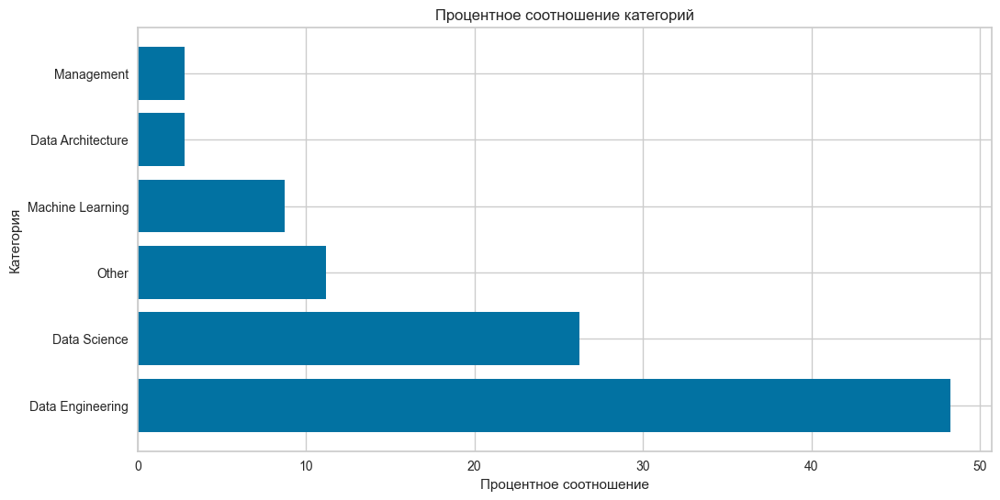

In [19]:
value_counts = data['job_category'].value_counts(normalize=True) * 100

fig, ax = plt.subplots(figsize=(12, 6))
top_n = min(17, len(value_counts))
ax.barh(value_counts.index[:top_n], value_counts.values[:top_n])
ax.set_xlabel('Процентное соотношение')
ax.set_ylabel('Категория')
ax.set_title('Процентное соотношение категорий')
plt.show()

Категория "Data Engineering" занимает наибольшую долю, составляя около 50%. За ней следует "Data Science" с долей примерно 25%. Категория "Other" представлена около 15%. "Machine Learning" охватывает чуть менее 10%. "Data Architecture" и "Management" занимают наименьшую долю, обе категории находятся ниже 5%.

Далее рассмотрим распределение по различным типам занятости.

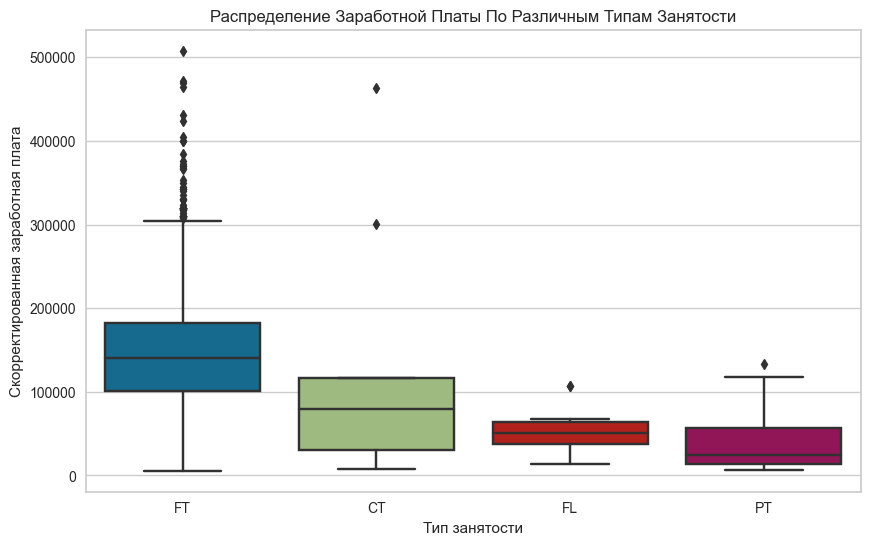

In [20]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=data, x='employment_type', y='adjusted_salary')
plt.title('Распределение Заработной Платы По Различным Типам Занятости')
plt.xlabel('Тип занятости')
plt.ylabel('Скорректированная заработная плата')
plt.show()

FT (Полный рабочий день):

Медианная зарплата находится ближе к нижней части ящика, что означает, что более половины сотрудников зарабатывают меньше средней заработной платы. Распределение имеет правостороннюю асимметрию: усы и выбросы простираются далеко вверх, что указывает на наличие значительного числа сотрудников с зарплатами выше медианы. Также наблюдается множество выбросов, представляющих исключительные случаи с очень высокими зарплатами.

CT (Контракт):

Медианная зарплата расположена ближе к середине бокса, что говорит о более симметричном распределении зарплат среди контрактных работников. В этой категории меньше выбросов по сравнению с FT.

FL (Фриланс):

Медианная зарплата ниже, чем в предыдущих категориях, и находится в верхней части ящика. Диапазон зарплат в этой группе относительно узкий, с небольшим количеством выбросов.

PT (Частичная занятость):

Медианная зарплата является самой низкой среди всех категорий. Ящик узкий, что свидетельствует о небольшом разнообразии зарплат. Один выброс указывает на зарплату, значительно превышающую типичные значения для этой категории.

adjusted_salary: mu = 142445.66, sigma = 64692.98
adjusted_salary: Skewness: 0.58
adjusted_salary: Kurtosis: 1.14


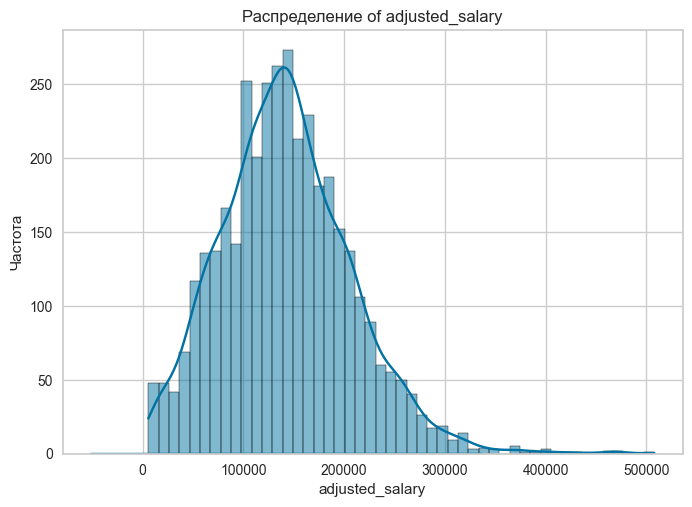

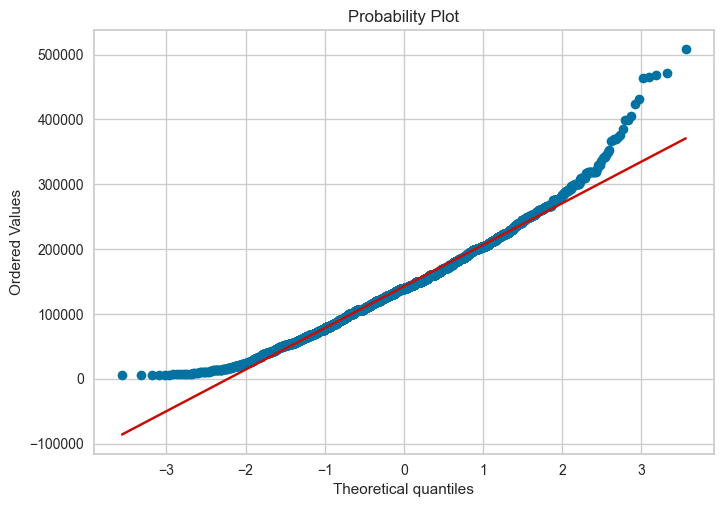

In [21]:
columns = ['adjusted_salary']

for col in columns:

    sns.histplot(data[col], kde=True)

    (mu, sigma) = stats.norm.fit(data[col])
    print('{}: mu = {:.2f}, sigma = {:.2f}'.format(col, mu, sigma))

    print('{}: Skewness: {:.2f}'.format(col, data[col].skew()))
    print('{}: Kurtosis: {:.2f}'.format(col, data[col].kurt()))

    x = np.linspace(mu - 3*sigma, mu + 3*sigma, 100)
    y = stats.norm.pdf(x, mu, sigma)
    plt.plot(x, y, label='Normal fit')

    plt.xlabel(col)
    plt.ylabel('Частота')
    plt.title('Распределение of {}'.format(col))

    fig = plt.figure()
    stats.probplot(data[col], plot=plt)

    plt.show()

Распределение имеет положительное асимметричное смещение (Skewness = 0.54), что указывает на то, что более тяжёлый "хвост" распределения находится справа. Эксцесс (Kurtosis = 0.83) немного выше, чем у нормального распределения, что свидетельствует о более острых пиках и тяжёлых хвостах. Среднее значение заработной платы составляет примерно 137 579,39 долларов США, со стандартным отклонением около 63 047,23 долларов США.

Вероятностный график (Probability Plot) отображает отсортированные значения заработной платы в виде синих точек по их теоретическим квантилям. Красная линия представляет идеальное нормальное распределение. График показывает отклонение от нормального распределения, особенно в хвостах (обе стороны графика поднимаются выше и опускаются ниже красной линии), что указывает на наличие выбросов или тяжёлых хвостов.

Многомерный анализ

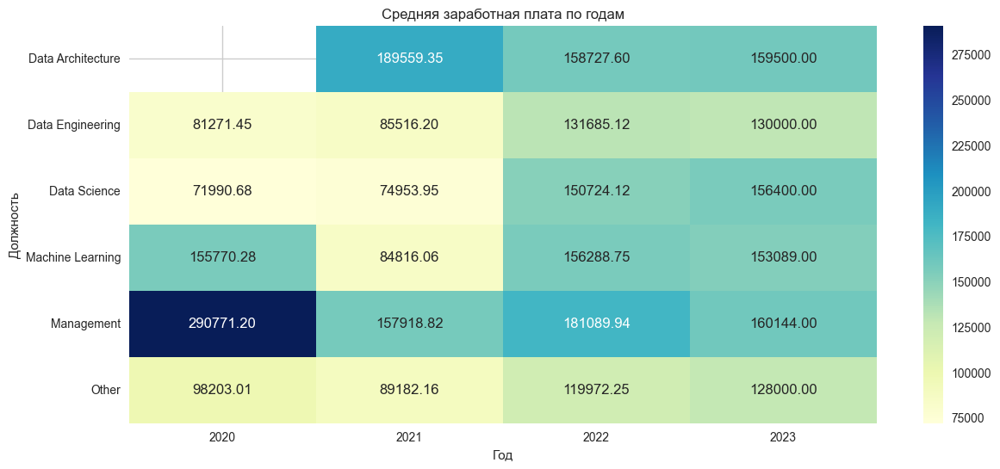

In [22]:
pivot_table = data.pivot_table(values='adjusted_salary', index='job_category', columns='work_year', aggfunc='median')
plt.figure(figsize=(14, 6))
sns.heatmap(pivot_table, annot=True, fmt=".2f", cmap="YlGnBu")
plt.title('Средняя заработная плата по годам')
plt.xlabel('Год')
plt.ylabel('Должность')
plt.show()

Зарплаты в категории Management находятся на самом высоком уровне среди всех представленных специальностей. Они начинаются с порядка 257 600 долларов в 2020 году и постепенно снижаются до 160 144 долларов в 2023 году.

В других категориях различия менее заметны, но каждая из них демонстрирует рост медианной зарплаты со временем. Например, в категории Data Engineering зарплаты возросли с 72 000 долларов в 2020 году до 130 000 долларов в 2023 году.

В категории Machine Learning наблюдается увеличение с 138 000 долларов в 2020 году до 153 089 долларов в 2023 году.

В категории Data Science также отмечается постепенный рост: от 62 726 долларов в 2020 году до 156 400 долларов в 2023 году.

Категории Data Architecture и Other показывают стабильный рост медианной зарплаты каждый год, хотя их значения остаются на самых низких уровнях среди представленных групп как в начале, так и в конце периода.

Теперь перейдем к сравнению заработной платы в зависимости от места жительства сотрудника и местонахождения компании.

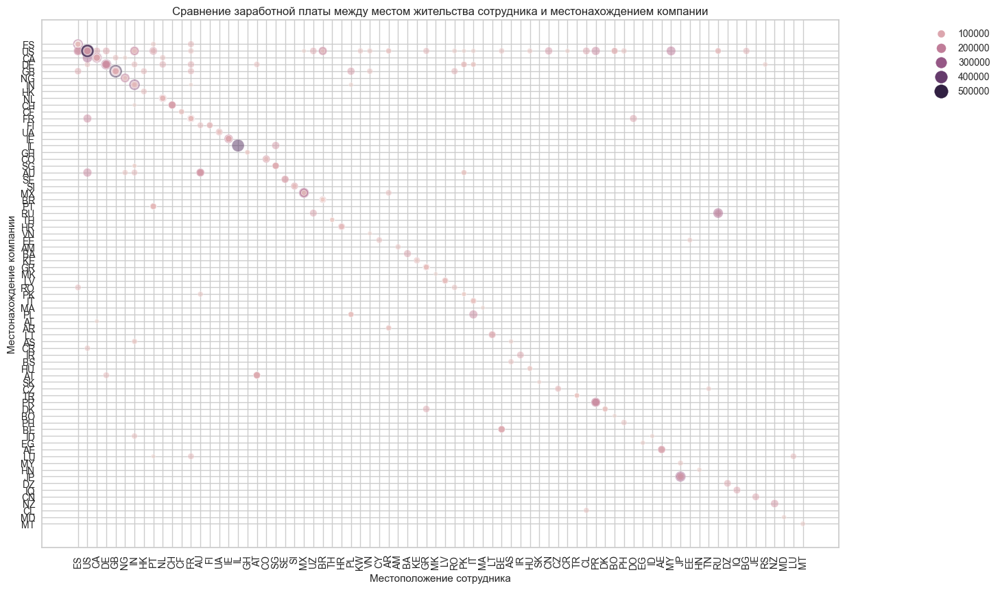

In [23]:
plt.figure(figsize=(15, 10))
sns.scatterplot(data=data, x='employee_residence', y='company_location', hue='adjusted_salary', size='adjusted_salary',\
                sizes=(20, 200), alpha=0.5)
plt.title('Сравнение заработной платы между местом жительства сотрудника и местонахождением компании')
plt.xlabel('Местоположение сотрудника')
plt.ylabel('Местонахождение компании')
plt.xticks(rotation=90)
plt.legend(loc='upper right', bbox_to_anchor=(1.2, 1))
plt.show()

Стандартизация численных признаков и кодировка категориальные признаки

In [24]:
categorical_columns = ['experience_level', 'employment_type', 'remote_ratio','company_size','job_category']
numerical_columns = ['adjusted_salary']

In [25]:
dummy_variables = pd.get_dummies(data, columns=categorical_columns, drop_first=False)


In [26]:
scaler = StandardScaler()

scaled_numerical = scaler.fit_transform(data[numerical_columns])

scaled_numerical_df = pd.DataFrame(scaled_numerical, columns=numerical_columns)

In [27]:
dummy_variables = dummy_variables.drop(numerical_columns, axis=1)

processed_df = pd.concat([dummy_variables, scaled_numerical_df], axis=1)
processed_df = processed_df.drop(['work_year', 'salary','salary_in_usd'], axis=1)

In [28]:
processed_df_copy = processed_df.drop(processed_df.select_dtypes(include = 'object'), axis = 1)


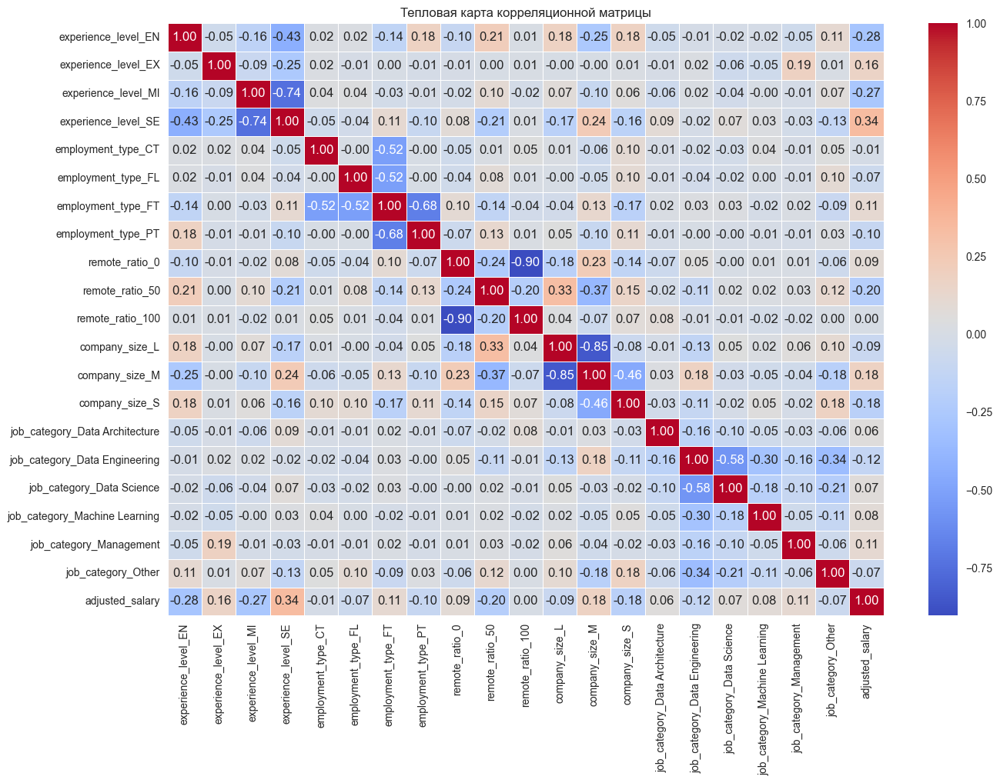

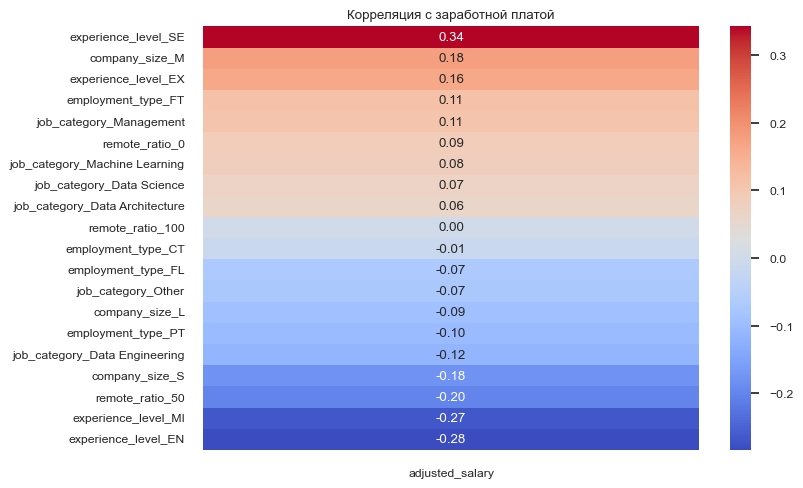

In [29]:
correlation_matrix = processed_df_copy.corr()

plt.figure(figsize=(15, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5, fmt='.2f')
plt.title("Тепловая карта корреляционной матрицы")
plt.show()

corr = processed_df_copy.corr()
target_corr = corr['adjusted_salary'].drop('adjusted_salary')

target_corr_sorted = target_corr.sort_values(ascending=False)


sns.set(font_scale=0.8)
sns.set_style("white")
sns.set_palette("PuBuGn_d")
sns.heatmap(target_corr_sorted.to_frame(), cmap="coolwarm", annot=True, fmt='.2f')
plt.title('Корреляция с заработной платой')
plt.show()

Положительные значения корреляции (обозначенные красным цветом) указывают на прямую связь между параметром и заработной платой: чем выше значение параметра, тем выше зарплата. Отрицательные значения корреляции (обозначенные синим цветом) указывают на обратную связь: чем выше значение параметра, тем ниже зарплата.

Наиболее значимые положительные корреляции:

experience_level_SE (0.34): Уровень опыта Senior Engineer имеет сильную положительную корреляцию с заработной платой.
company_size_M (0.18): Средний размер компании (Medium) имеет умеренную положительную корреляцию с зарплатой.
experience_level_EX (0.16): Очень высокий уровень опыта (Expert) также имеет положительную корреляцию с зарплатой.
Наиболее значимые отрицательные корреляции:

experience_level_EN (-0.28): Начальный уровень опыта (Entry-level Engineer) имеет сильную отрицательную корреляцию с зарплатой.
experience_level_MI (-0.27): Средний уровень опыта (Mid-level Engineer) также имеет отрицательную корреляцию с зарплатой.
remote_ratio_50 (-0.20) и company_size_S (-0.18): Работа на 50% удаленно и небольшой размер компании имеют умеренно отрицательную корреляцию с зарплатой.
Другие параметры также демонстрируют различные уровни корреляции с заработной платой, но их значения имеют меньшую абсолютную величину, что указывает на менее выраженную связь с зарплатой.

Построение модели линейной регрессии

In [30]:
processed_df_copy.head()


,experience_level_EN,experience_level_EX,experience_level_MI,experience_level_SE,employment_type_CT,employment_type_FL,employment_type_FT,employment_type_PT,remote_ratio_0,remote_ratio_50,...,company_size_L,company_size_M,company_size_S,job_category_Data Architecture,job_category_Data Engineering,job_category_Data Science,job_category_Machine Learning,job_category_Management,job_category_Other,adjusted_salary
0,False,False,False,True,False,False,True,False,False,False,...,True,False,False,False,False,False,False,False,True,-0.874881
1,False,False,True,False,True,False,False,False,False,False,...,False,False,True,False,False,False,True,False,False,-1.738143
2,False,False,True,False,True,False,False,False,False,False,...,False,False,True,False,False,False,True,False,False,-1.807703
3,False,False,False,True,False,False,True,False,False,False,...,False,True,False,False,False,True,False,False,False,0.503213
4,False,False,False,True,False,False,True,False,False,False,...,False,True,False,False,False,True,False,False,False,-0.346957


In [31]:
X = processed_df_copy.drop(["adjusted_salary"], axis=1)
y = processed_df_copy["adjusted_salary"]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [32]:
lr = LinearRegression()
lr.fit(X_train, y_train)
y_train_pred = lr.predict(X_train)
print(f'MSE: {mean_squared_error(y_train, y_train_pred)},\
\nMAE :{mean_absolute_error( y_train, y_train_pred)},\
\n R2: {r2_score(y_train, y_train_pred)}')

MSE: 0.7550672742489428,
MAE :0.6651514163305668,
 R2: 0.2478068189825967


In [33]:
y_test_pred = lr.predict(X_test)
print(f'MSE: {mean_squared_error( y_test, y_test_pred)},\
\nMAE :{mean_absolute_error( y_test, y_test_pred)},\
\n R2: {r2_score(y_test, y_test_pred)}')

MSE: 0.7788504814161654,
MAE :0.6928270451639009,
 R2: 0.20789226800778227


Результаты на обучающей выборке:

MSE (Среднеквадратичная ошибка): 0.755
MAE (Средняя абсолютная ошибка): 0.665
R² (Коэффициент детерминации): 0.248
Эти значения отражают качество модели на обучающих данных. Коэффициент детерминации R² близок к 0.25, что указывает на низкую объясняющую способность модели.

Результаты на тестовой выборке:

MSE: 0.779
MAE: 0.693
R²: 0.208
Эти результаты немного хуже, чем на обучающем наборе: коэффициент детерминации R² составляет около 0.21, что означает, что модель объясняет вариативность тестовой выборки хуже, чем обучающей.

В целом, результаты показывают, что модель линейной регрессии не демонстрирует высокое качество прогнозирования для представленных данных, так как R² достаточно низкий как на обучающих, так и на тестовых данных. Это может свидетельствовать о наличии нелинейных зависимостей между предикторами и целевой переменной, недостатке информации для модели или необходимости использования более сложных методов предсказания.

Построение модели дерева решений


In [35]:
tree_model = DecisionTreeRegressor(random_state=42)
tree_model.fit(X_train, y_train)

DecisionTreeRegressor(random_state=42)

In [36]:
y_tree_pred = tree_model.predict(X_test)
rmse = mean_squared_error(y_test, y_tree_pred, squared=False)
r2_tree = r2_score(y_test, y_tree_pred)

print(f'RMSE: {rmse}, R²: {r2_tree}')

RMSE: 0.8787239007191612, R²: 0.2147010114629594


In [37]:
param_grid = {'max_depth': [3, 5, 7, 10], 'min_samples_split': [2, 5, 10]}
grid_search = GridSearchCV(DecisionTreeRegressor(random_state=42), param_grid, cv=5)
grid_search.fit(X_train, y_train)

print('Лучшие параметры:', grid_search.best_params_)

Лучшие параметры: {'max_depth': 5, 'min_samples_split': 10}


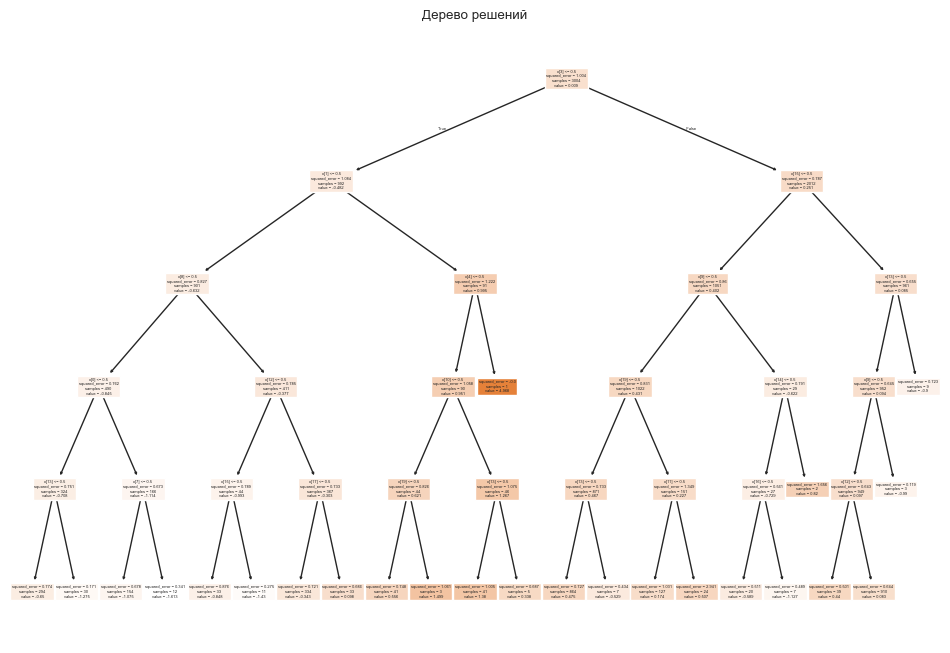

In [38]:
plt.figure(figsize=(12, 8))
plot_tree(grid_search.best_estimator_, filled=True)
plt.title("Дерево решений")
plt.show()

Разбиение данных оказалось довольно успешным. Модель показывает лучшие результаты при параметрах {'max_depth': 5, 'min_samples_split': 10}. По метрикам RMSE и R² эта модель немного превосходит линейную регрессию.

Построение ансамблевой модели


In [40]:
rf_model = RandomForestRegressor(random_state=42)
rf_model.fit(X_train, y_train)
y_rf_pred = rf_model.predict(X_test)
rf_r2 = r2_score(y_test, y_rf_pred)

In [41]:
gb_model = GradientBoostingRegressor(random_state=42)
gb_model.fit(X_train, y_train)
y_gb_pred = gb_model.predict(X_test)
gb_r2 = r2_score(y_test, y_gb_pred)

In [42]:
print(f'Random Forest R²: {rf_r2}, Gradient Boosting R²: {gb_r2}')

Random Forest R²: 0.21832057897591528, Gradient Boosting R²: 0.22429985393921292


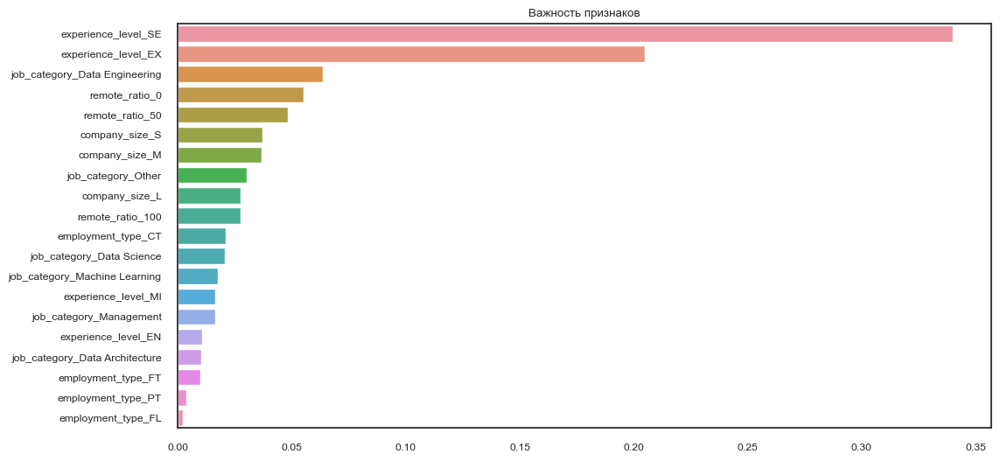

In [43]:
importances = rf_model.feature_importances_
indices = np.argsort(importances)[::-1]
plt.figure(figsize=(12, 6))
sns.barplot(x=importances[indices], y=X.columns[indices])
plt.title("Важность признаков")
plt.show()

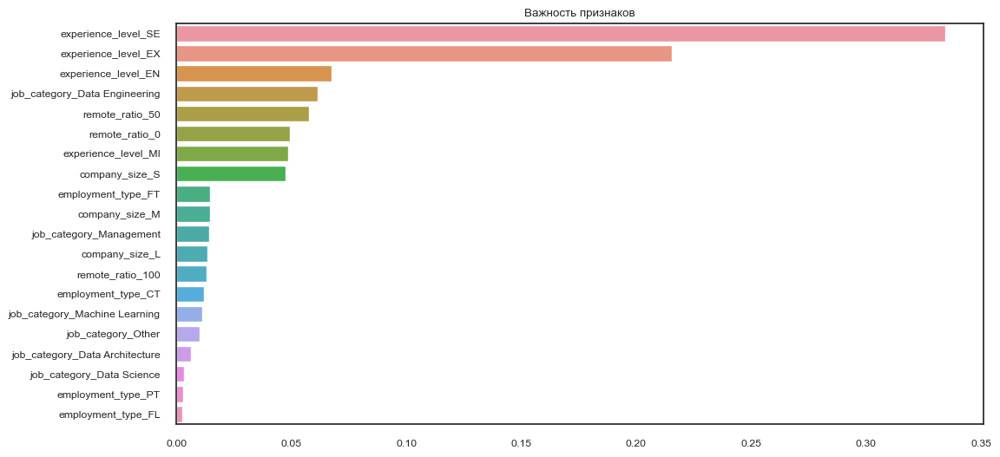

In [44]:
importances = gb_model.feature_importances_
indices = np.argsort(importances)[::-1]
plt.figure(figsize=(12, 6))
sns.barplot(x=importances[indices], y=X.columns[indices])
plt.title("Важность признаков")
plt.show()

'experience_level' ,'job_category' и 'remote_ratio' оказывают наибольшее влияние на уровень заработной платы.

Понижение размерности с помощью PCA

In [45]:
pca = PCA(n_components=0.95)  # сохраняем 95% дисперсии
X_pca = pca.fit_transform(X)

In [46]:
X_train_pca, X_test_pca = train_test_split(X_pca, test_size=0.2, random_state=42)
model_pca = LinearRegression()
model_pca.fit(X_train_pca, y_train)

LinearRegression()

In [47]:
y_pca_pred = model_pca.predict(X_test_pca)
pca_mae = mean_absolute_error(y_test, y_pca_pred)
pca_mse = mean_squared_error(y_test, y_pca_pred)
pca_r2 = r2_score(y_test, y_pca_pred)

print(f'PCA MAE: {pca_mae}, PCA MSE: {pca_mse}, PCA R²: {pca_r2}')

PCA MAE: 0.689635452898666, PCA MSE: 0.7741646251460454, PCA R²: 0.2126578848638152


После применения алгоритма понижения размерности данных (PCA) метрики MAE и MSE практически не изменились, а метрика R² повысилась на доли процента. Это указывает на то, что использование PCA не привело к улучшению модели линейной регрессии. Возможно, это связано с тем, что данных недостаточно, и связь между ними является более сложной, чем линейной.

Кластеризация

In [48]:
mms = MinMaxScaler()
processed_df_copy = pd.DataFrame(mms.fit_transform(processed_df_copy), columns=processed_df_copy.columns)

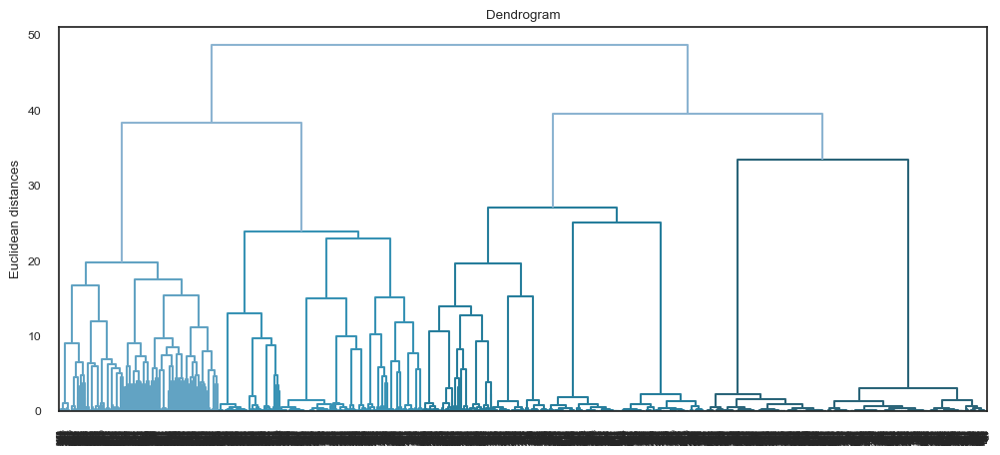

In [49]:
plt.figure(figsize=(12, 5))
dendrogram = sch.dendrogram(sch.linkage(processed_df_copy, method = 'ward'))
plt.title('Dendrogram')
plt.ylabel('Euclidean distances')
plt.show()

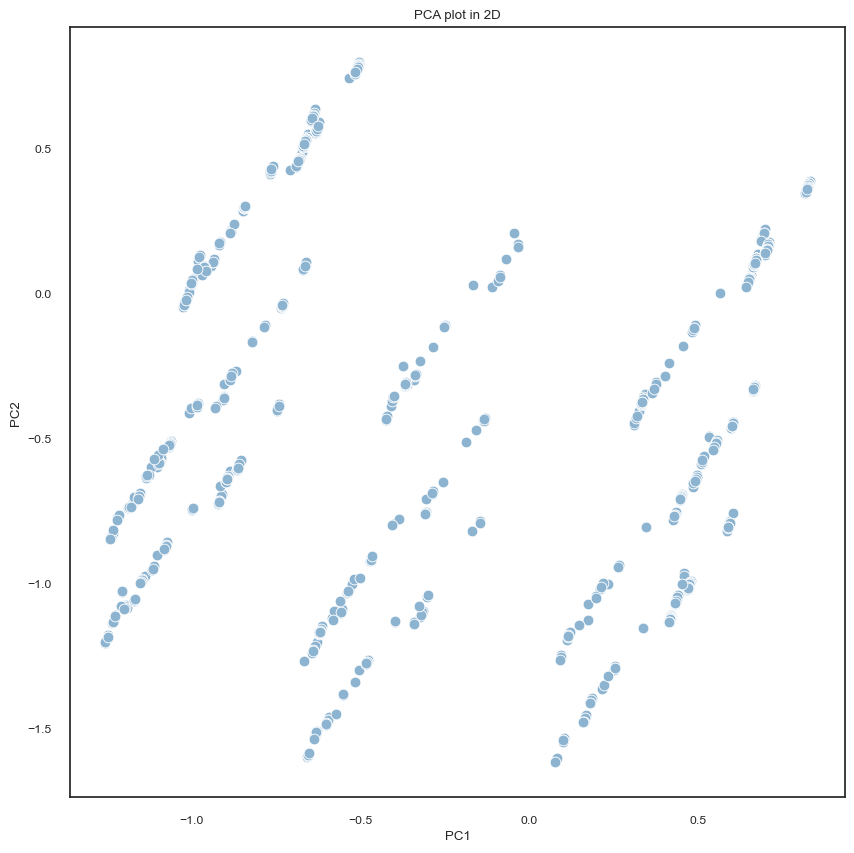

In [50]:
principal_df = pd.DataFrame(data = PCA(n_components=2).fit_transform(processed_df_copy))

fig = plt.figure(figsize=(10, 10))
sns.scatterplot(x = principal_df.iloc[:,0],
                y = principal_df.iloc[:,1],
                s=60)

plt.title('PCA plot in 2D')
plt.xlabel('PC1')
plt.ylabel('PC2');

In [51]:
def TSNEplot(pred=None):
    tsne = TSNE(random_state=1)

    X_tsne = tsne.fit_transform(processed_df_copy)

    plt.figure(figsize=(12, 10))
    plt.scatter(X_tsne[:, 0],
                X_tsne[:, 1],
                c = pred,
                edgecolor="none",
                alpha=0.7, s=40,
        cmap=plt.cm.get_cmap("flare", 3))

    plt.colorbar()
    plt.title("t-SNE projection");

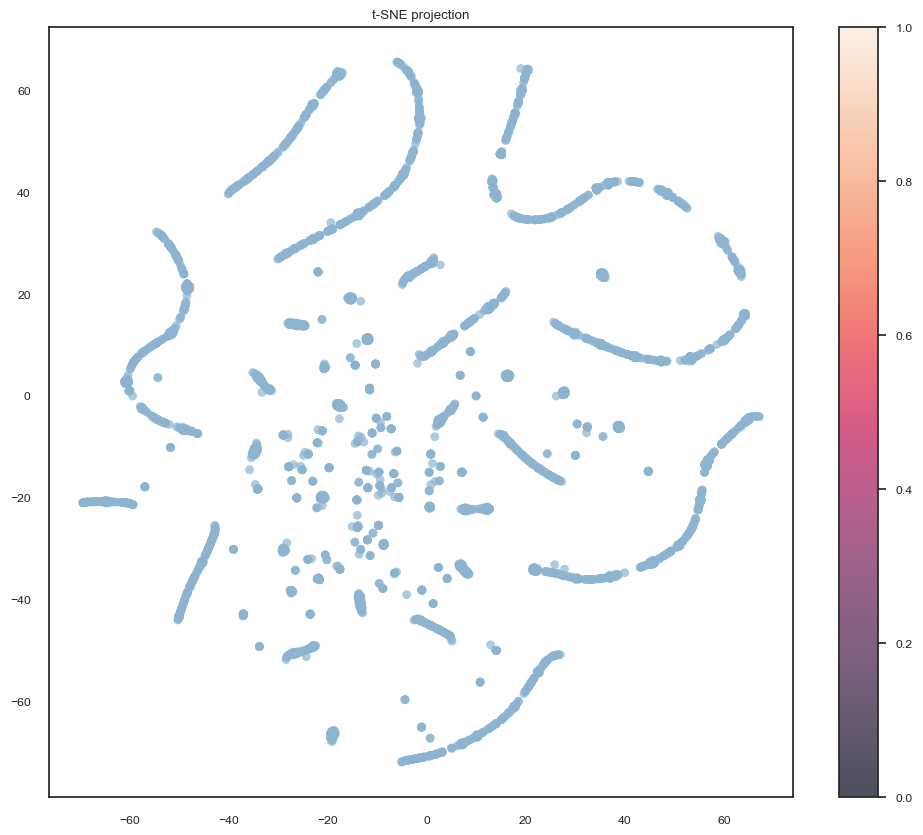

In [52]:
TSNEplot()

In [53]:
def PCAplot3D(x_data, y_data=None):
    components = PCA(n_components=3).fit_transform(x_data)

    fig = px.scatter_3d(
        components,
        x=0, y=1, z=2,
        color=y_data,
        size=0.1*np.ones(len(X)),
        opacity = 1,
        title='PCA plot in 3D',
        labels={'0': 'PC 1', '1': 'PC 2', '2': 'PC 3'},
        width=900, height=900
    )
    fig.show()

In [54]:
PCAplot3D(processed_df_copy)


Выбор метода кластеризации

Кластеризация часто ассоциируется с методом k-средних, но это не единственный метод. В библиотеке scikit-learn представлено 11 различных методов кластеризации, каждый из которых может быть более подходящим в зависимости от конкретных задач.

В данном случае учитываются следующие факторы:

Набор данных разбит на 3 класса.
Количество данных не слишком велико.
При визуальном осмотре можно выделить 3 кластера.
Проекция на плоскость имеет значительную дисперсию.
На основе этих факторов выбраны методы K-Means, Spectral Clustering, DBSCAN и Agglomerative Clustering (метод Уорда). Главным параметром у этих методов является число кластеров, и на графиках распределения, схожих с нашим, эти методы демонстрируют достаточно хорошую работу.

K-Means

In [55]:
pca = PCA(n_components=2)

kmeans = KMeans(n_clusters=3, random_state=1, n_init='auto').fit(processed_df_copy)
centroids_pca = pca.fit_transform(kmeans.cluster_centers_)
pred_k = kmeans.labels_

principal_df = pd.DataFrame(data = PCA(n_components=2).fit_transform(processed_df_copy))

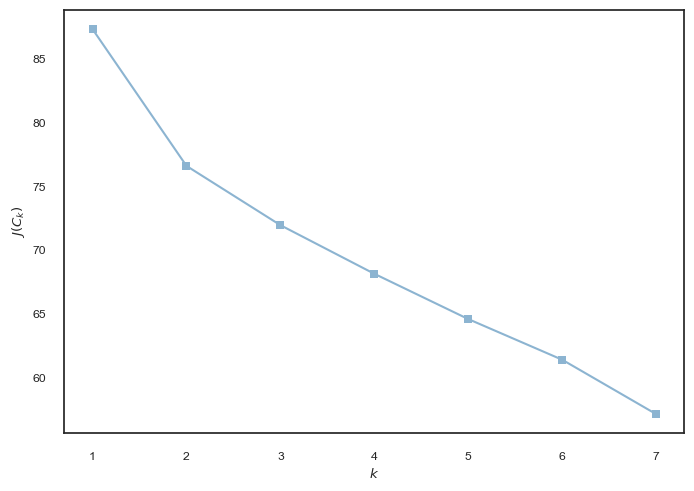

In [56]:
inertia = []
for k in range(1, 8):
    kmeans = KMeans(n_clusters=k, random_state=1, n_init='auto').fit(processed_df_copy)
    inertia.append(np.sqrt(kmeans.inertia_))

plt.plot(range(1, 8), inertia, marker="s")
plt.xlabel("$k$")
plt.ylabel("$J(C_k)$");

In [57]:
pca = PCA(n_components=2)


kmeans = KMeans(n_clusters=3, random_state=1, n_init='auto').fit(processed_df_copy)
centroids_pca = pca.fit_transform(kmeans.cluster_centers_)
pred_k = kmeans.labels_

principal_df = pd.DataFrame(data = PCA(n_components=2).fit_transform(processed_df_copy))

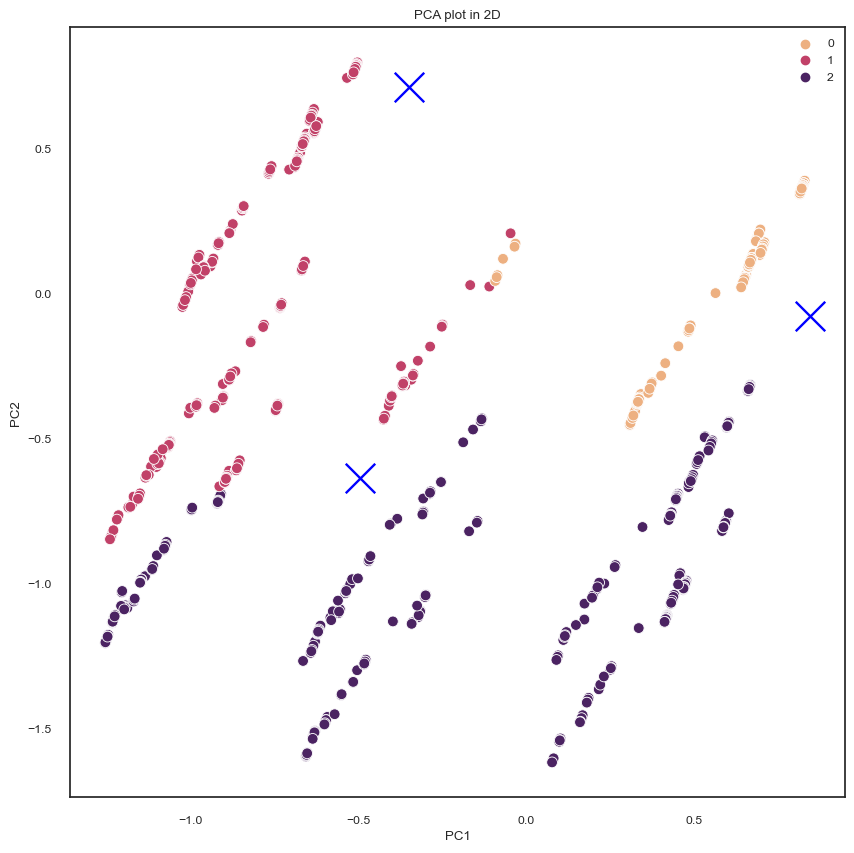

In [58]:
fig = plt.figure(figsize=(10, 10))
sns.scatterplot(x = principal_df.iloc[:,0],
                y = principal_df.iloc[:,1],
                hue = pred_k,
                palette="flare",
                s=60)
sns.scatterplot(x = centroids_pca[:,0],
                y =  centroids_pca[:,1],
                marker="x",
                s=450,
                color = 'blue')
plt.title('PCA plot in 2D')
plt.xlabel('PC1')
plt.ylabel('PC2');

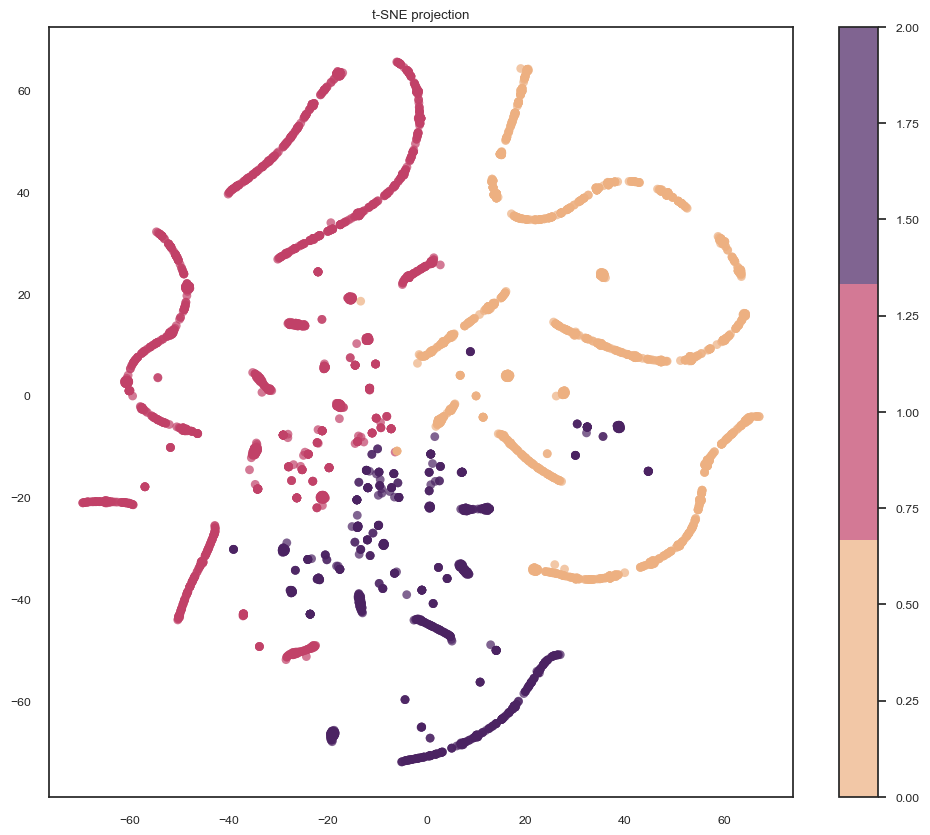

In [59]:
TSNEplot(pred_k)


In [60]:
PCAplot3D(processed_df_copy, pred_k)


Silhouette - это метод оценки, который измеряет сходство между объектами внутри одного кластера и различие между объектами разных кластеров. Он рассчитывается как отношение разности между средним расстоянием от объекта до других объектов в его кластере (значение a в формуле) и средним расстоянием от объекта до объектов в ближайшем кластере (значение b в формуле) к максимальному из этих двух значений. Высокое значение silhouette указывает на то, что объекты хорошо сгруппированы внутри кластеров и чётко отделены от других кластеров.

Variance Ratio Criterion (VRC) - это критерий, который оценивает качество кластеризации как отношение межкластерной дисперсии к внутрикластерной дисперсии. Межкластерная дисперсия рассчитывается как сумма квадратов расстояний между центроидами кластеров и общим центроидом, в то время как внутрикластерная дисперсия определяется как сумма квадратов расстояний от каждой точки до её собственного центроида в кластере. Высокое значение VRC указывает на лучшее разделение между кластерами и меньшее рассеяние внутри кластеров

In [61]:
silhouette = silhouette_score(X, pred_k)
chi = calinski_harabasz_score(X, pred_k)
print('\nK-Means')
print('_'*45 + '\n')
print('Силуэт', round(silhouette,3))
print('Variance Rarion Criterion', round(chi,3))
rs_k = rand_score(kmeans.labels_, y)
print(" rand_score = {} \n\n {} из 3755 предсказано верно \n".format(rs_k, rs_k * 3755))


K-Means
_____________________________________________

Силуэт 0.292
Variance Rarion Criterion 895.765
 rand_score = 0.6475356956130948 

 2431.4965370271707 из 3755 предсказано верно 



Построим распределения по каждому кластеру

In [62]:
df_cluster = processed_df_copy.copy()
df_cluster['K-Means'] = pred_k

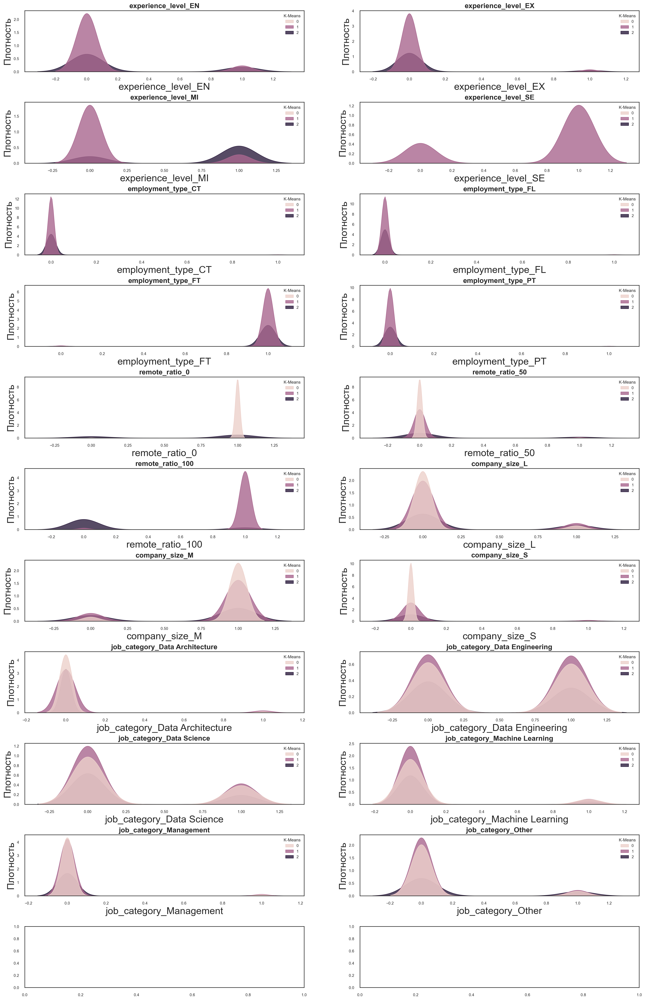

In [63]:
# Создаем матрицу графиков для визуализации распредления по каждой переменной
fig, axes = plt.subplots(11,2, figsize = (25,40), dpi=200)

# Расстояние между графиками
plt.subplots_adjust(hspace=0.5)

# Список значений признаков для цикла
columns = processed_df_copy.columns[:-1]

# Строим распределения (kdeplot) для каждого признака
for i, column in enumerate(columns):
    ax = axes[i // 2, i % 2]
    sns.kdeplot(data = df_cluster,
                x = column,
                fill = True,
                alpha = 0.8,
                hue = 'K-Means',
                ax = ax)

    ax.set_title(column, fontweight = 'bold', fontsize = 16)
    ax.set_xlabel(column, fontsize = 22)
    ax.set_ylabel('Плотность', fontsize = 22)

Agglomerative Clustering by Ward

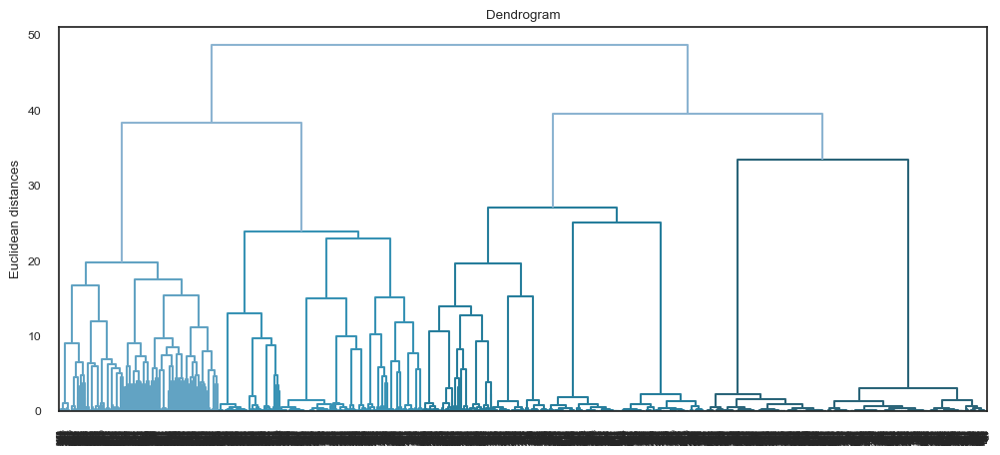

In [64]:
from matplotlib import pyplot
pyplot.figure(figsize=(12, 5))
dendrogram = sch.dendrogram(sch.linkage(processed_df_copy, method = 'ward'))
plt.title('Dendrogram')
plt.ylabel('Euclidean distances')
plt.show()

In [65]:
clustering_ward = AgglomerativeClustering(3).fit(processed_df_copy)
pred_ward = clustering_ward.labels_

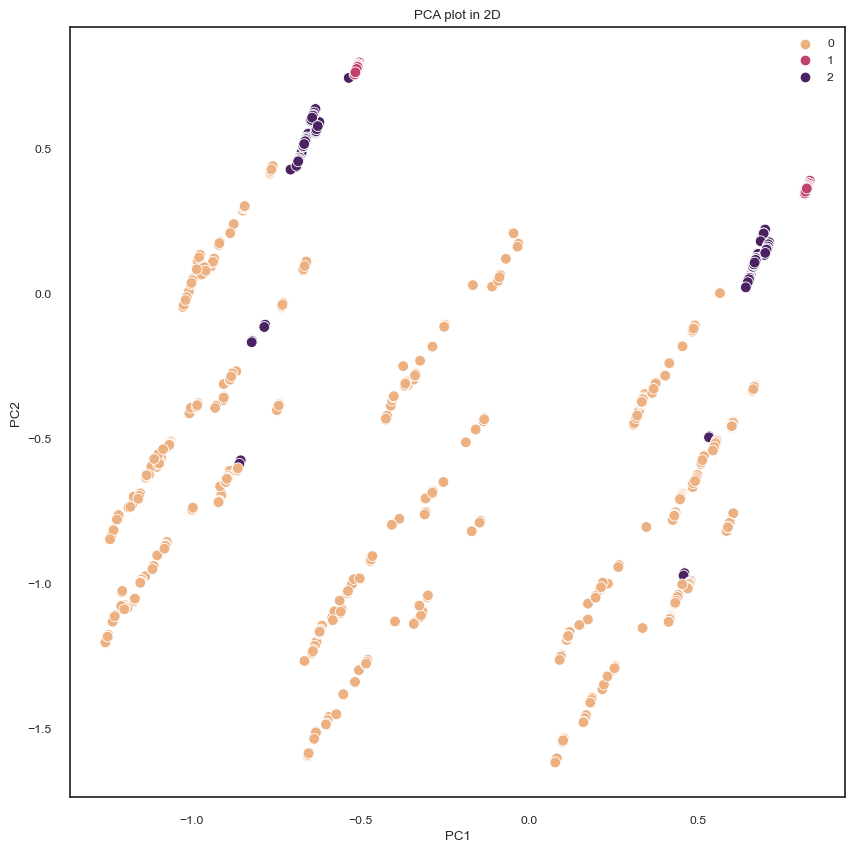

In [66]:
fig = plt.figure(figsize=(10, 10))
sns.scatterplot(x = principal_df.iloc[:,0],
                y = principal_df.iloc[:,1],
                hue = pred_ward,
                palette="flare",
                s=60)
plt.title('PCA plot in 2D')
plt.xlabel('PC1')
plt.ylabel('PC2');

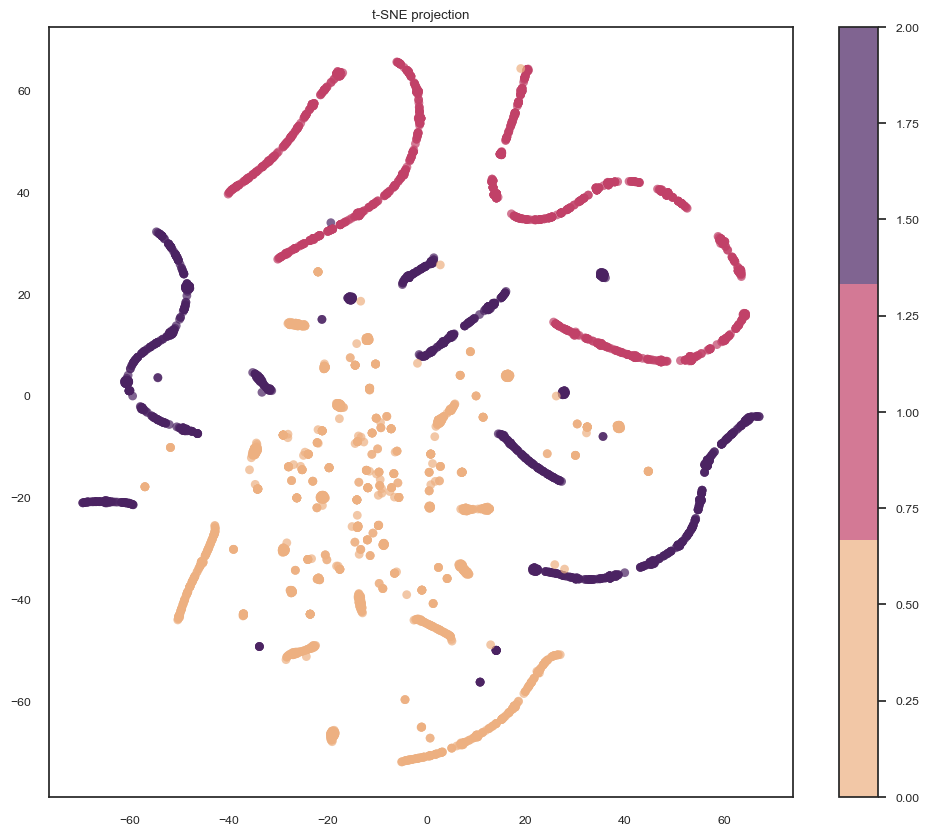

In [67]:
TSNEplot(pred_ward)

In [68]:
PCAplot3D(processed_df_copy, pred_ward)


In [69]:
silhouette = silhouette_score(processed_df_copy, pred_ward)
chi = calinski_harabasz_score(processed_df_copy, pred_ward)
print('Agglomerative Clustering')
print('_'*45 + '\n')
print('Силуэт', round(silhouette,3))
print('Variance Rarion Criterion', round(chi,3))
rs_ward = rand_score(pred_ward, y)
print(" rand_score = {} \n\n {} из 3755 предсказано верно \n".format(rs_ward, rs_ward * 3755))

Agglomerative Clustering
_____________________________________________

Силуэт 0.208
Variance Rarion Criterion 649.322
 rand_score = 0.6613877288105293 

 2483.5109216835376 из 3755 предсказано верно 



In [70]:
df_cluster['Agglomerative'] = pred_ward

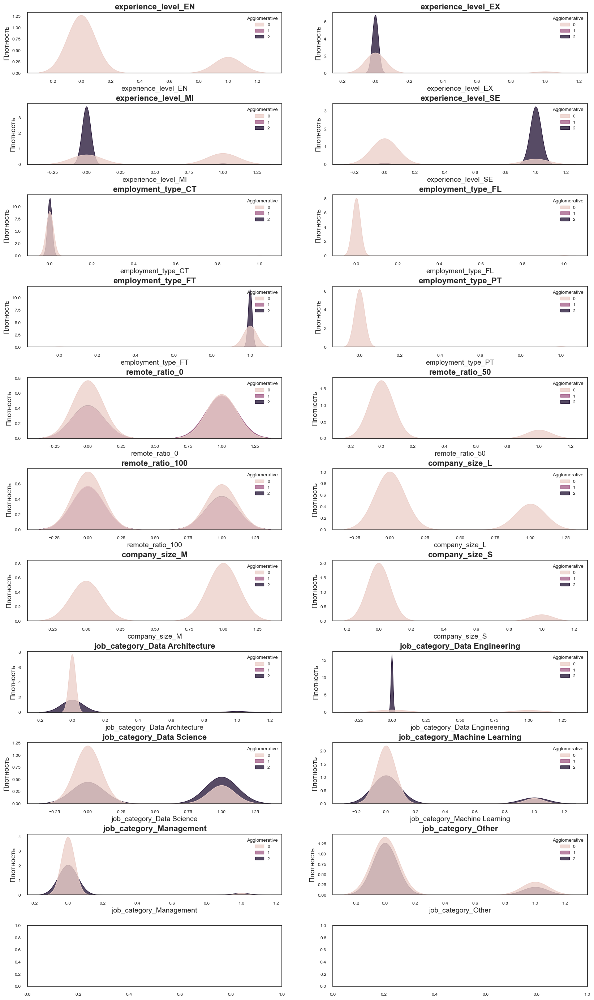

In [71]:
# Создаем матрицу графиков для визуализации распредления по каждой переменной
fig, axes = plt.subplots(11,2, figsize = (20,35))

# Расстояние между графиками
plt.subplots_adjust(hspace=0.5)

# Список значений признаков для цикла
columns = processed_df_copy.columns[:-1]

# Строим распределения (kdeplot) для каждого признака
for i, column in enumerate(columns):
    ax = axes[i // 2, i % 2]
    sns.kdeplot(data = df_cluster,
                x = column,
                fill = True,
                alpha = 0.8,
                hue = 'Agglomerative',
                ax = ax)

    ax.set_title(column, fontweight = 'bold', fontsize = 16)
    ax.set_xlabel(column, fontsize = 14)
    ax.set_ylabel('Плотность', fontsize = 14)

Spectral Clustering

In [72]:
clustering_sp = SpectralClustering(3).fit(processed_df_copy)
pred_sp = clustering_sp.labels_

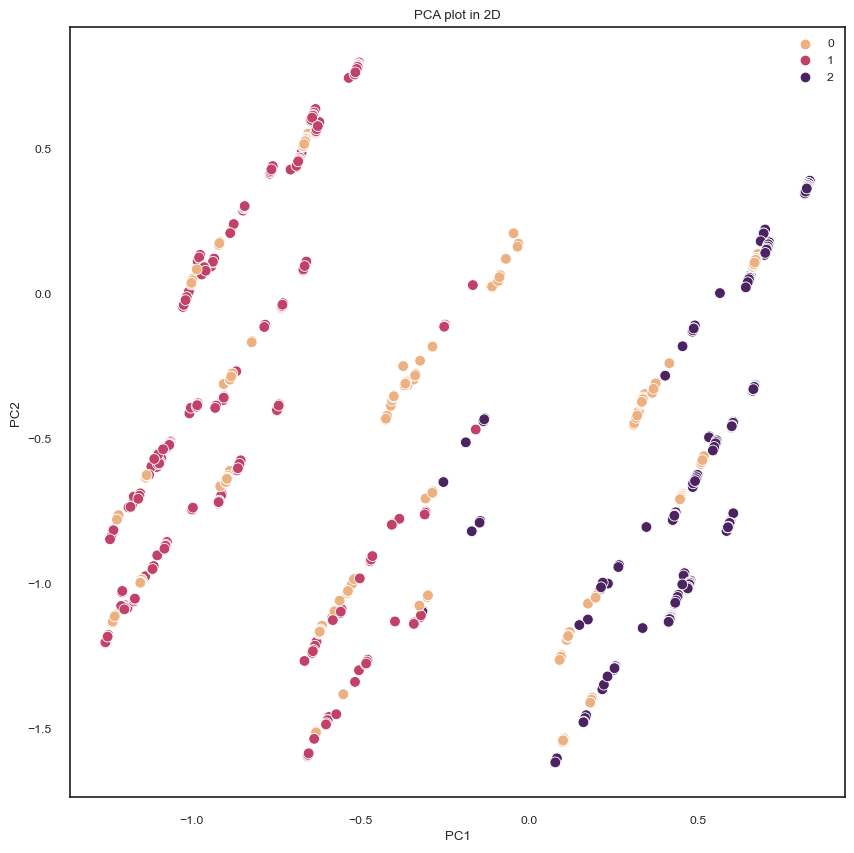

In [73]:
fig = plt.figure(figsize=(10, 10))
sns.scatterplot(x = principal_df.iloc[:,0],
                y = principal_df.iloc[:,1],
                hue = pred_sp,
                palette="flare",
                s=60)
plt.title('PCA plot in 2D')
plt.xlabel('PC1')
plt.ylabel('PC2');

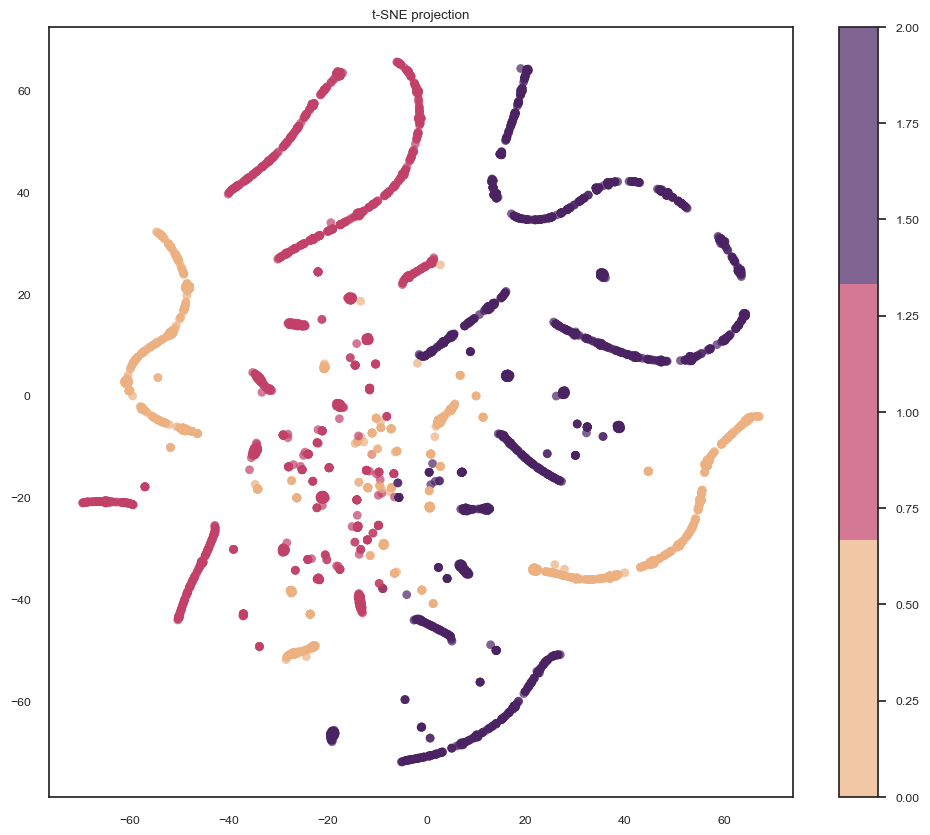

In [74]:
TSNEplot(pred_sp)


In [75]:
PCAplot3D(processed_df_copy, pred_sp)


In [76]:
silhouette = silhouette_score(X, pred_sp)
chi = calinski_harabasz_score(X, pred_sp)
print('Spectral Clustering')
print('_'*45 + '\n')
print('Силуэт', round(silhouette,3))
print('Variance Rarion Criterion', round(chi,3))
rs_sp = rand_score(pred_sp, y)
print(" rand_score = {} \n\n {} из 3755 предсказано верно \n".format(rs_sp, rs_sp * 3755))

Spectral Clustering
_____________________________________________

Силуэт 0.288
Variance Rarion Criterion 832.265
 rand_score = 0.6570630386620007 

 2467.2717101758126 из 3755 предсказано верно 



Предсказательная способность немного улучшилась, используя Spectral Clustering

In [77]:
df_cluster['Spectral'] = pred_sp


DBSCAN

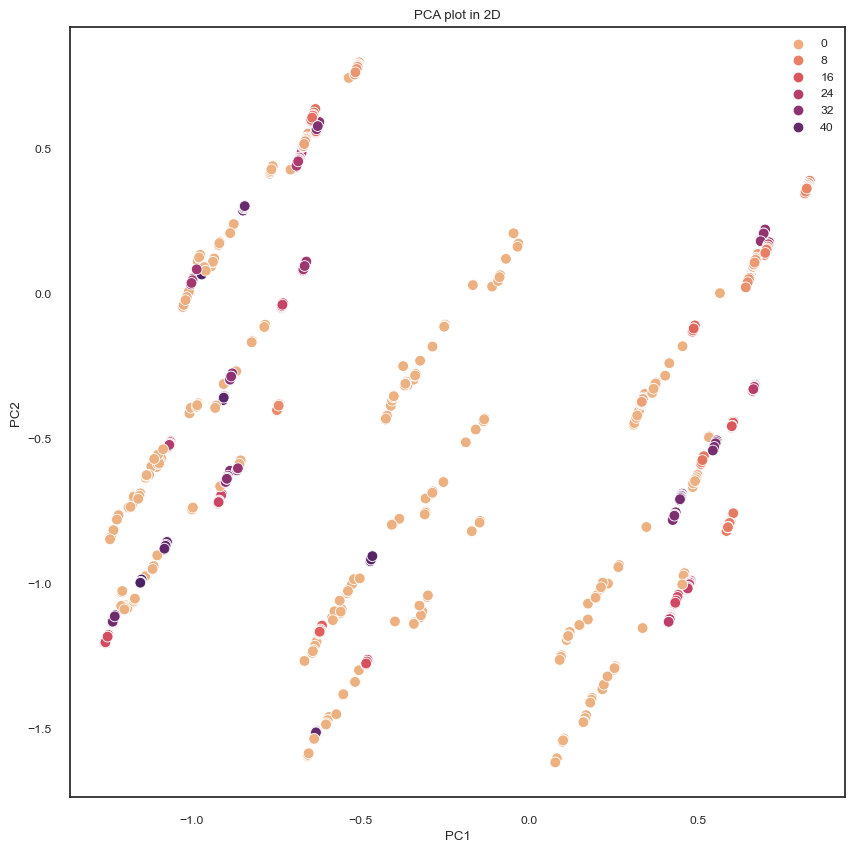

In [78]:
from sklearn.cluster import DBSCAN
clustering_db = DBSCAN(eps=0.5, min_samples=10).fit(processed_df_copy)
pred_db = clustering_db.labels_
fig = plt.figure(figsize=(10, 10))
sns.scatterplot(x = principal_df.iloc[:,0],
                y = principal_df.iloc[:,1],
                hue = pred_db,
                palette="flare",
                s=60)
plt.title('PCA plot in 2D')
plt.xlabel('PC1')
plt.ylabel('PC2');

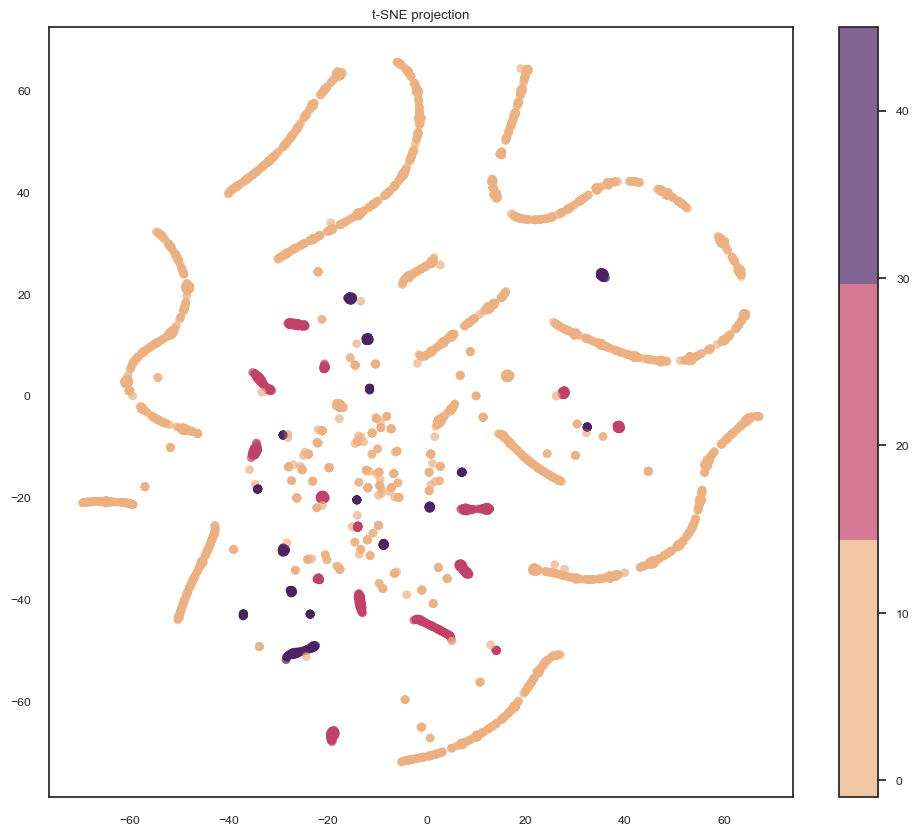

In [79]:
TSNEplot(pred_db)


In [80]:
PCAplot3D(processed_df_copy, pred_db)


In [81]:
silhouette = silhouette_score(processed_df_copy, pred_db)
chi = calinski_harabasz_score(processed_df_copy, pred_db)
print('DBSCAN')
print('_'*45 + '\n')
print('Силуэт', round(silhouette,3))
print('Variance Rarion Criterion', round(chi,3))
rs_db = rand_score(pred_db, y)
print(" rand_score = {} \n\n {} из 3755 предсказано верно \n".format(rs_db, rs_db * 3755))

DBSCAN
_____________________________________________

Силуэт 0.787
Variance Rarion Criterion 440.275
 rand_score = 0.9175762098767972 

 3445.4986680873735 из 3755 предсказано верно 



In [82]:
df_cluster['DBSCAN'] = pred_db


Предсказательная способность DBSCAN намного выше. Около 90% данных верно предсказаны.



In [83]:
# Создаем матрицу графиков для визуализации распредления по каждой переменной
fig, axes = plt.subplots(11,2, figsize = (35,100), dpi=250)

# Расстояние между графиками
plt.subplots_adjust(hspace=0.5, wspace=0.3)

# Список значений признаков для цикла
columns = processed_df_copy.columns[:-1]

# Строим распределения (kdeplot) для каждого признака
for i, column in enumerate(columns):
    ax = axes[i // 2, i % 2]
    sns.kdeplot(data = df_cluster,
                x = column,
                fill = True,
                alpha = 0.8,
                hue = 'DBSCAN',
                ax = ax)

    ax.set_title(column, fontweight = 'bold', fontsize = 16)
    ax.set_xlabel(column, fontsize = 14)
    ax.set_ylabel('Плотность', fontsize = 14)

Методы, выбранные для кластеризации, показали различные результаты:

DBSCAN продемонстрировал наилучшие результаты, обеспечив наиболее качественное разделение данных.
K-Means показал достойные результаты, но не был таким эффективным, как DBSCAN.
Spectral Clustering и Agglomerative Clustering by Ward достигли умеренных результатов, правильно предсказав около 60% данных.
Agglomerative Clustering и Spectral Clustering продемонстрировали лучшие показатели по Rand Score и количеству правильно предсказанных объектов. K-Means показал средние результаты, а DBSCAN оказался наиболее успешным.

Выбор оптимального алгоритма зависит от конкретных требований к качеству кластеризации:

Для высокой точности подойдут Agglomerative Clustering или Spectral Clustering.
Для простоты и скорости лучше использовать K-Means.
Silhouette Score: Оценивает, насколько хорошо точки данных в кластере схожи с другими точками в том же кластере и отличны от точек в других кластерах. Значение Silhouette колеблется от -1 до 1, где 1 указывает на идеальную кластеризацию, а 0 — на случайное распределение кластеров. В данном случае все алгоритмы имеют значение Silhouette ниже 0.3, что указывает на слабую кластеризацию.

Variance Ratio Criterion: Оценивает степень компактности кластеров, где более низкие значения указывают на более компактные кластеры. Все алгоритмы, за исключением DBSCAN, показали схожие значения, что свидетельствует о умеренной дисперсии кластеров.

In [84]:
df_cluster[['K-Means','Agglomerative', 'Spectral', 'DBSCAN']]


,K-Means,Agglomerative,Spectral,DBSCAN
0,1,0,1,0
1,2,0,1,-1
2,2,0,1,-1
3,1,2,0,1
4,1,2,0,1
...,...,...,...,...
3750,1,0,0,28
3751,2,0,1,18
3752,1,0,0,-1
3753,1,0,1,-1
